In [ ]:
#| hide
import sys
sys.path.append("/notebooks/katlas")
from nbdev.showdoc import *
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [ ]:
from fastbook import *
from katlas.core import Data
import seaborn as sns
# from katlas.feature import *
# from katlas.plot import *
# from sklearn.preprocessing import StandardScaler
# from joblib import dump, load
# import numpy as np

In [ ]:
def get_k(df, kinase):
    kk = df.loc[kinase].reset_index()

    kk.rename(columns={'index':'substrate'},inplace=True)

    kk['position'] = kk.substrate.str.extract('(-?\d+)')
    kk['aa'] = kk.substrate.str[-1]
    return kk

def compare_k(df,k1,k2):
    d = get_k(df,k1)
    e = get_k(df,k2)
    de = d.merge(e,on='substrate',how = 'left')
    return de

In [ ]:
def post_process(df):
    # Unstack
    df = df.unstack().reset_index(name = 'target')
    
    # Rename column
    df = df.rename(columns = {'level_0':'substrate'})
    
    # Reorder column
    df = df[['kinase','substrate','target']]
    
    # Deal with some warning issue
    df = df.copy()
    
    # Divide substrate info into position and aa
    df['position'] = df.substrate.str.extract('(-?\d+)')
    df['aa'] = df.substrate.str[-1]
    
    # Remove 's' as it is a duplicate of 't'
    df = df[df['aa'] != 's'].reset_index(drop=True)
    
    return df

In [ ]:
def plot_assay(unstack, kinase):
    aa_order = [i for i in 'PGACSTVILMFYWHKRQNDEty']
    position_order = [str(i) for i in range(-5,5)]
    position_order.remove('0')
    
    k = unstack.query(f'kinase == "{kinase}"')
    kk = k.pivot(index='aa',columns='position',values='target')
    kkk = kk.reindex(index=aa_order, columns=position_order)
    
    plt.figure(figsize=(6, 10))
    sns.heatmap(kkk, cmap='binary', annot=False)
    plt.title(kinase)
    plt.show()

# Prepare target for training

> We will try several methods to transform the target data for better prediction

In this module, we will show you two methods to transform data:
- Standardize
- Percentile Rank

## Get data

In [ ]:
# Download raw peptide library screening data
raw = Data.get_kinase_raw()

In [ ]:
raw = raw.set_index('kinase')

In [ ]:
raw

,-5P,-5G,-5A,-5C,-5S,-5T,-5V,-5I,-5L,-5M,-5F,-5Y,-5W,-5H,-5K,-5R,-5Q,-5N,-5D,-5E,-5s,-5t,-5y,-4P,-4G,-4A,-4C,-4S,-4T,-4V,-4I,-4L,-4M,-4F,-4Y,-4W,-4H,-4K,-4R,-4Q,-4N,-4D,-4E,-4s,-4t,-4y,-3P,-3G,-3A,-3C,-3S,-3T,-3V,-3I,-3L,-3M,-3F,-3Y,-3W,-3H,-3K,-3R,-3Q,-3N,-3D,-3E,-3s,-3t,-3y,-2P,-2G,-2A,-2C,-2S,-2T,-2V,-2I,-2L,-2M,-2F,-2Y,-2W,-2H,-2K,-2R,-2Q,-2N,-2D,-2E,-2s,-2t,-2y,-1P,-1G,-1A,-1C,-1S,-1T,-1V,-1I,-1L,-1M,-1F,-1Y,-1W,-1H,-1K,-1R,-1Q,-1N,-1D,-1E,-1s,-1t,-1y,1P,1G,1A,1C,1S,1T,1V,1I,1L,1M,1F,1Y,1W,1H,1K,1R,1Q,1N,1D,1E,1s,1t,1y,2P,2G,2A,2C,2S,2T,2V,2I,2L,2M,2F,2Y,2W,2H,2K,2R,2Q,2N,2D,2E,2s,2t,2y,3P,3G,3A,3C,3S,3T,3V,3I,3L,3M,3F,3Y,3W,3H,3K,3R,3Q,3N,3D,3E,3s,3t,3y,4P,4G,4A,4C,4S,4T,4V,4I,4L,4M,4F,4Y,4W,4H,4K,4R,4Q,4N,4D,4E,4s,4t,4y
kinase,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAK1,7.614134e+06,2.590563e+06,3.001315e+06,4.696631e+06,4.944312e+06,8.315838e+06,1.005654e+07,1.643306e+07,1.049974e+07,9.133578e+06,4.493054e+06,1.006273e+07,3.327455e+06,3.504743e+06,2.767294e+06,1.010574e+07,5.923673e+06,2.909153e+06,1.695156e+06,1.617849e+06,2.128670e+06,2.128670e+06,6.460995e+06,5.260313e+06,6.325834e+06,6.957994e+06,5.369435e+06,5.713921e+06,6.612202e+06,6.093662e+06,6.120309e+06,7.306988e+06,6.829678e+06,5.119222e+06,5.263236e+06,3.974771e+06,5.065008e+06,7.968511e+06,7.041049e+06,6.174444e+06,4.228327e+06,3.271231e+06,5.511934e+06,3.267818e+06,3.267818e+06,3.338570e+06,8.921287e+06,4.210323e+06,9.202468e+06,5.247518e+06,6.741480e+06,6.810878e+06,5.271476e+06,4.928032e+06,4.337562e+06,6.432257e+06,4.006022e+06,3.383022e+06,3.493591e+06,3.269350e+06,4.253144e+06,4.777087e+06,5.719014e+06,4.787112e+06,2.233865e+06,3.045337e+06,2.489664e+06,2.489664e+06,2.253600e+06,2.216029e+06,2.766177e+06,5.269960e+06,5.606488e+06,5.715777e+06,8.442377e+06,3.330816e+06,3.699660e+06,5.573758e+06,1.141874e+07,3.289922e+06,3.904724e+06,2.831768e+06,5.548345e+06,5.749699e+06,5.431821e+06,1.485362e+07,7.911792e+06,7.877661e+06,6.228872e+06,2.050311e+06,2.050311e+06,4.757609e+06,1.274357e+07,7.922826e+06,4.320089e+06,3.424102e+06,2.951131e+06,3.531424e+06,4.395649e+06,4.876362e+06,7.337788e+06,6.213208e+06,6.110447e+06,8.716737e+06,4.935260e+06,7.723412e+06,1.379149e+07,1.035962e+07,4.456719e+06,4.865705e+06,1.811253e+06,1.639403e+06,1.357999e+06,1.357999e+06,2.002371e+06,6415286.88,99964895.25,4.316875e+06,3.007075e+06,2.745786e+06,8.910120e+06,1.483692e+06,1.412341e+06,1.811600e+06,1.711245e+06,1.783236e+06,1.979521e+06,2.246919e+06,2.217612e+06,2.688448e+06,3.450818e+06,1.911930e+06,2358432.64,1421652.45,1.359588e+06,1.706013e+06,1.706013e+06,1389641.63,5.119158e+06,7.278540e+06,7.284322e+06,6.474715e+06,8.229141e+06,3.132517e+07,5.271194e+06,3.595811e+06,4.019474e+06,4.672000e+06,4.719446e+06,4.458959e+06,5.560394e+06,6.019748e+06,5.603859e+06,7.520621e+06,7.492737e+06,8.100332e+06,5364638.21,5087031.12,3.976345e+06,3.976345e+06,3.984759e+06,7.873215e+06,1.066693e+07,6.726092e+06,8.347111e+06,8.474127e+06,3.624343e+07,7.049439e+06,4.480458e+06,5.646461e+06,5.049205e+06,4.966940e+06,6.154423e+06,5.554385e+06,7.784626e+06,8.536455e+06,1.041152e+07,7.199440e+06,8.496116e+06,4678462.79,4293019.55,3.871242e+06,3.871242e+06,4.144314e+06,6.754641e+06,7.548893e+06,6.945442e+06,6.316584e+06,5.852228e+06,1.198637e+07,4.544765e+06,4.468426e+06,4.958371e+06,4.992757e+06,5.630292e+06,5.605199e+06,8.889243e+06,6.020663e+06,8.938081e+06,9.983402e+06,6.833482e+06,6.364453e+06,4.189046e+06,4.921596e+06,2.705054e+06,2.705054e+06,2.909280e+06
ACVR2A,4.991039e+06,5.783856e+06,7.015771e+06,8.367603e+06,7.072052e+06,7.601400e+06,7.188292e+06,7.513916e+06,7.159895e+06,6.266123e+06,7.217726e+06,6.944710e+06,9.655464e+06,6.855045e+06,6.135260e+06,5.714942e+06,5.174360e+06,6.446238e+06,1.067680e+07,9.490371e+06,9.417512e+06,9.417512e+06,9.143263e+06,5.189501e+06,6.115977e+06,6.183207e+06,8.746775e+06,8.620216e+06

## Decide quantile

In [ ]:
r2 = (raw/1000000).round(2)

See how the x axis range among kinase are so different

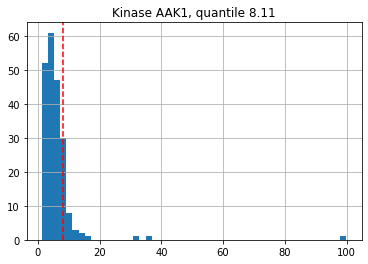

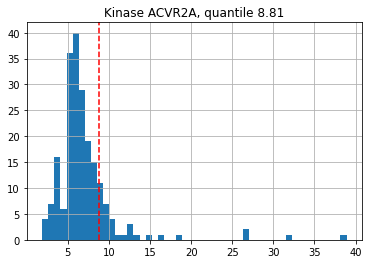

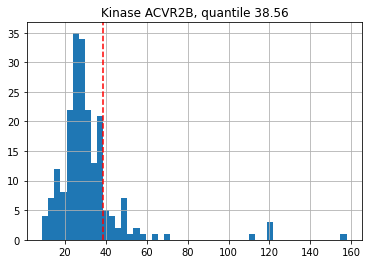

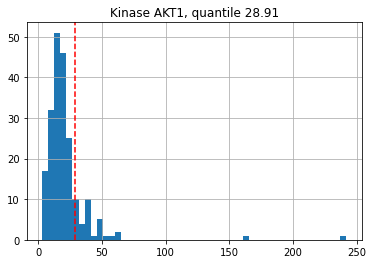

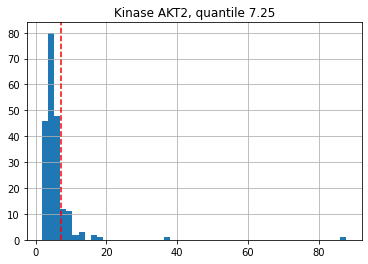

...

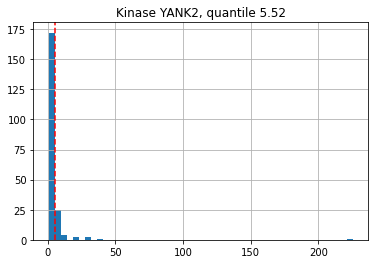

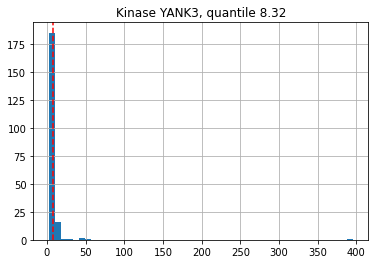

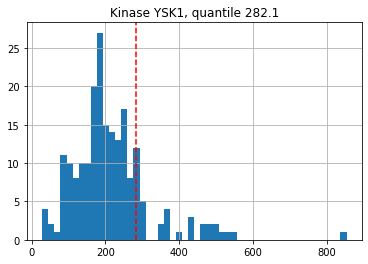

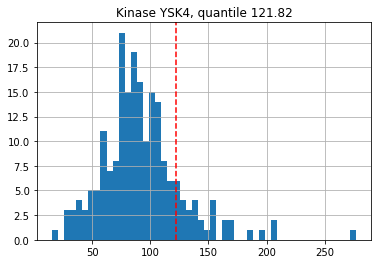

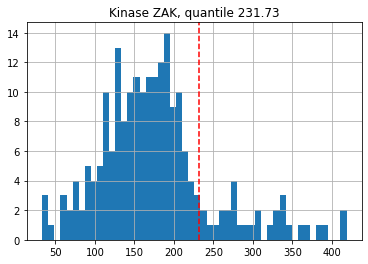

In [ ]:
for i, r in r2.iterrows():
    q = r.quantile(0.85)
    r.hist(bins=50)
    plt.axvline(x=q, color='red', linestyle='--')
    plt.title(f'Kinase {i}, quantile {q.round(2)}')
    plt.show()

It seems quantile 0.85 works very well, as it distinguishes low values from high values in most kinases

In [ ]:
q = raw.quantile(0.85,axis=1)

In [ ]:
q

kinase
AAK1      8.113213e+06
ACVR2A    8.804136e+06
ACVR2B    3.856305e+07
AKT1      2.890356e+07
AKT2      7.250803e+06
              ...     
YANK2     5.518290e+06
YANK3     8.323669e+06
YSK1      2.820983e+08
YSK4      1.218167e+08
ZAK       2.317284e+08
Name: 0.85, Length: 303, dtype: float64

## Divide by 0.85 quantile

In [ ]:
scaled1 = raw.div(q,axis='index')

In [ ]:
scaled1

,-5P,-5G,-5A,-5C,-5S,-5T,-5V,-5I,-5L,-5M,-5F,-5Y,-5W,-5H,-5K,-5R,-5Q,-5N,-5D,-5E,-5s,-5t,-5y,-4P,-4G,-4A,-4C,-4S,-4T,-4V,-4I,-4L,-4M,-4F,-4Y,-4W,-4H,-4K,-4R,-4Q,-4N,-4D,-4E,-4s,-4t,-4y,-3P,-3G,-3A,-3C,-3S,-3T,-3V,-3I,-3L,-3M,-3F,-3Y,-3W,-3H,-3K,-3R,-3Q,-3N,-3D,-3E,-3s,-3t,-3y,-2P,-2G,-2A,-2C,-2S,-2T,-2V,-2I,-2L,-2M,-2F,-2Y,-2W,-2H,-2K,-2R,-2Q,-2N,-2D,-2E,-2s,-2t,-2y,-1P,-1G,-1A,-1C,-1S,-1T,-1V,-1I,-1L,-1M,-1F,-1Y,-1W,-1H,-1K,-1R,-1Q,-1N,-1D,-1E,-1s,-1t,-1y,1P,1G,1A,1C,1S,1T,1V,1I,1L,1M,1F,1Y,1W,1H,1K,1R,1Q,1N,1D,1E,1s,1t,1y,2P,2G,2A,2C,2S,2T,2V,2I,2L,2M,2F,2Y,2W,2H,2K,2R,2Q,2N,2D,2E,2s,2t,2y,3P,3G,3A,3C,3S,3T,3V,3I,3L,3M,3F,3Y,3W,3H,3K,3R,3Q,3N,3D,3E,3s,3t,3y,4P,4G,4A,4C,4S,4T,4V,4I,4L,4M,4F,4Y,4W,4H,4K,4R,4Q,4N,4D,4E,4s,4t,4y
kinase,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AAK1,0.938486,0.319302,0.369929,0.578887,0.609415,1.024975,1.239527,2.025469,1.294153,1.125766,0.553795,1.240289,0.410128,0.431980,0.341085,1.245591,0.730127,0.358570,0.208938,0.199409,0.262371,0.262371,0.796355,0.648364,0.779695,0.857613,0.661814,0.704273,0.814992,0.751079,0.754363,0.900628,0.841797,0.630973,0.648724,0.489913,0.624291,0.982165,0.867850,0.761036,0.521166,0.403198,0.679377,0.402777,0.402777,0.411498,1.099600,0.518946,1.134257,0.646787,0.830926,0.839480,0.649740,0.607408,0.534629,0.792813,0.493765,0.416977,0.430605,0.402966,0.524224,0.588803,0.704901,0.590039,0.275337,0.375355,0.306865,0.306865,0.277769,0.273138,0.340947,0.649553,0.691032,0.704502,1.040571,0.410542,0.456004,0.686998,1.407425,0.405502,0.481280,0.349032,0.683865,0.708683,0.669503,1.830794,0.975174,0.970967,0.767744,0.252713,0.252713,0.586403,1.570718,0.976534,0.532476,0.422040,0.363744,0.435268,0.541789,0.601040,0.904425,0.765814,0.753148,1.074388,0.608299,0.951955,1.699880,1.276883,0.549316,0.599726,0.223247,0.202066,0.167381,0.167381,0.246804,0.790721,12.321247,0.532080,0.370639,0.338434,1.098223,0.182874,0.174079,0.223290,0.210921,0.219794,0.243987,0.276946,0.273333,0.331367,0.425333,0.235656,0.290690,0.175227,0.167577,0.210276,0.210276,0.171281,0.630966,0.897122,0.897835,0.798046,1.014289,3.861007,0.649705,0.443204,0.495423,0.575851,0.581699,0.549592,0.685350,0.741968,0.690708,0.926960,0.923523,0.998412,0.661222,0.627006,0.490107,0.490107,0.491144,0.970419,1.314760,0.829029,1.028829,1.044485,4.467210,0.868884,0.552242,0.695959,0.622343,0.612204,0.758568,0.684610,0.959500,1.052167,1.283279,0.887372,1.047195,0.576647,0.529139,0.477153,0.477153,0.510811,0.832548,0.930444,0.856066,0.778555,0.721321,1.477389,0.560168,0.550759,0.611148,0.615386,0.693966,0.690873,1.095650,0.742081,1.101670,1.230512,0.842266,0.784455,0.516324,0.606615,0.333413,0.333413,0.358585
ACVR2A,0.566897,0.656948,0.796872,0.950417,0.803265,0.863390,0.816468,0.853453,0.813242,0.711725,0.819811,0.788801,1.096696,0.778616,0.696861,0.649120,0.587719,0.732183,1.212703,1.077945,1.069669,1.069669,1.038519,0.589439,0.694671,0.702307,0.993485,0.979110,1.017541,0.688081,0.666275,0.658262,0.729800,0.783362,0.741500,0.954625,0.697906,0.513863,0.578740,0.610487,0.634426,1.316660,1.100125,1.023606,1.023606,0.862621,0.609097,0.791912,0.650847,1.015382,1.008889,1.043876,0.661860,0.609838,0.580756,0.624478,0.625455,0.666987,0.716354,0.642095,0.430001,0.558574,0.615970,0.609124,1.273601,1.460892,1.461234,1.461234,1.182299,0.271187,0.422445,0.448074,1.483972,1.078146,0.930325,0.424310,0.383308,0.363964,0.336761,0.426176,0.420387,0.456014,0.411759,0.299457,0.426205,0.649443,0.571051,3.633639,4.418916,0.854118,0.854118,0.608931,0.452044,0.381293,0.549929,1.686014,0.895570,0.943574,0.738827,0.537948,0.852334,0.963130,0.782196,0.890466,0.927973,0.715750,0.355890,0.386085,0.601754,0.545931,0.823018,0.865417,0.917973,0.917973,1.211425,0.222896,0.376774,0.423775,1.185968,0.784345,0.881281,0.867757,0.769834,0.571864,0.652116,0.610126,0.635781,0.629638,0.458466,0.214167,0.2

In [ ]:
compare_k(scaled1, "CK1G1","CK1G2").query('aa_x == "t"')

,substrate,CK1G1,position_x,aa_x,CK1G2,position_y,aa_y
21,-5t,1.030599,-5,t,3.093690,-5,t
44,-4t,3.009822,-4,t,3.554811,-4,t
67,-3t,22.540822,-3,t,31.445353,-3,t
90,-2t,1.589787,-2,t,4.512661,-2,t
113,-1t,0.298541,-1,t,1.400368,-1,t
136,1t,0.243385,1,t,0.751538,1,t
159,2t,0.274163,2,t,0.541241,2,t
182,3t,0.509377,3,t,0.997152,3,t
205,4t,0.944168,4,t,1.393335,4,t


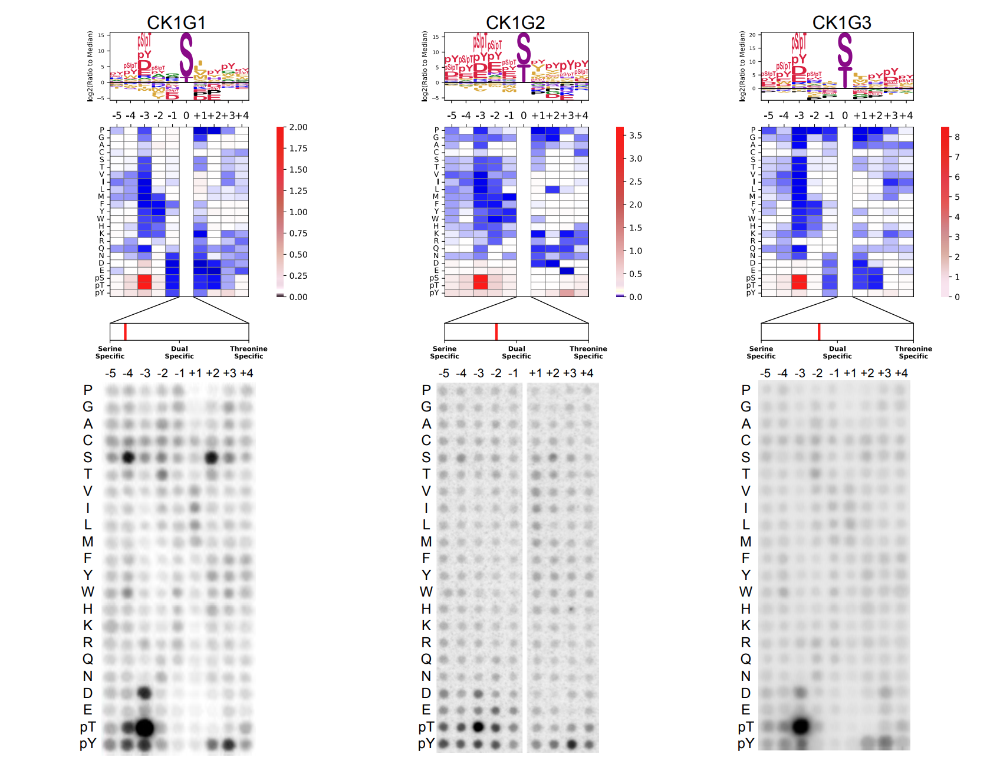

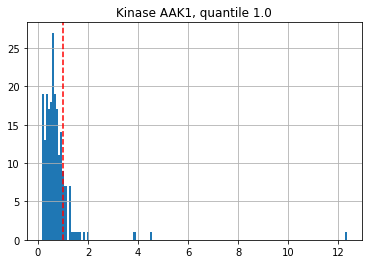

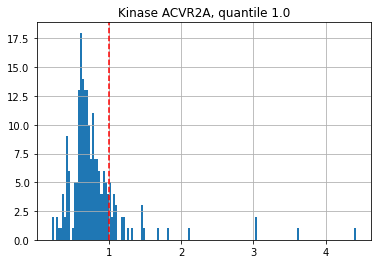

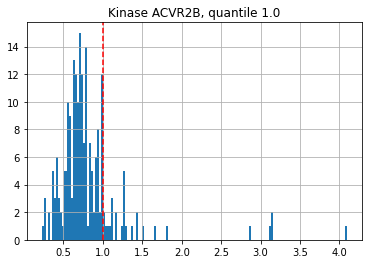

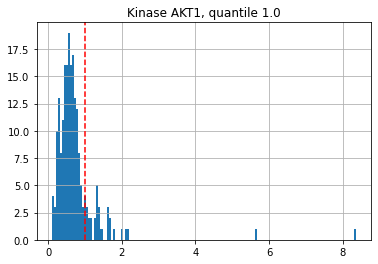

...

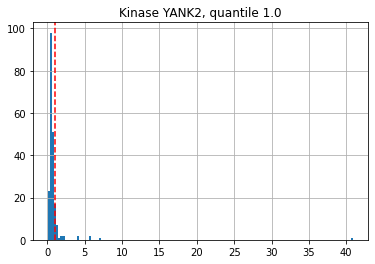

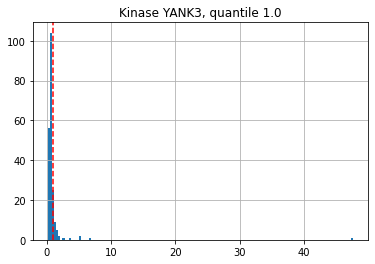

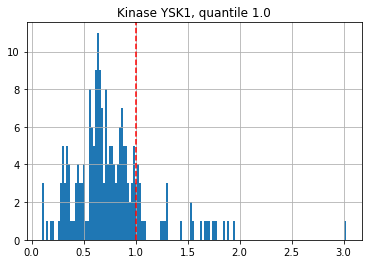

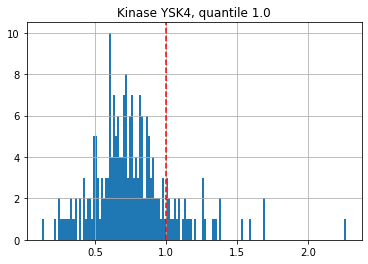

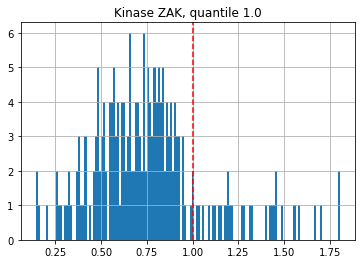

In [ ]:
for i,r in scaled1.iterrows():
    q = r.quantile(0.85)
    r.hist(bins=150)
    plt.axvline(x=q, color='red', linestyle='--')
    plt.title(f'Kinase {i}, quantile {q.round(2)}')
    # plt.xlim([min(r), q + q +q +q +q])
    plt.show()

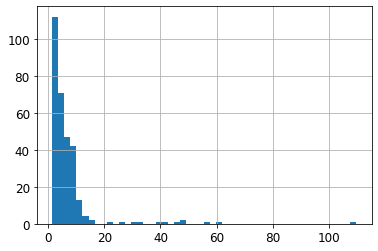

In [ ]:
scaled1.max(axis=1).hist(bins=50);

## Get background average, and divide by it

In [ ]:
factor = raw.apply(lambda r: r[r < q[r.name]].mean(),axis=1)

In [ ]:
factor

kinase
AAK1      4.564909e+06
ACVR2A    5.919948e+06
ACVR2B    2.635383e+07
AKT1      1.607078e+07
AKT2      4.406038e+06
              ...     
YANK2     3.246309e+06
YANK3     5.331586e+06
YSK1      1.805483e+08
YSK4      8.189540e+07
ZAK       1.526832e+08
Length: 303, dtype: float64

In [ ]:
scaled2 = raw.div(factor,axis='index')

In [ ]:
compare_k(scaled2, "CK1G1","CK1G2").query('aa_x == "t"')

,substrate,CK1G1,position_x,aa_x,CK1G2,position_y,aa_y
21,-5t,1.884042,-5,t,7.127682,-5,t
44,-4t,5.502269,-4,t,8.190078,-4,t
67,-3t,41.206980,-3,t,72.448275,-3,t
90,-2t,2.906296,-2,t,10.396911,-2,t
113,-1t,0.545764,-1,t,3.226368,-1,t
136,1t,0.444933,1,t,1.731501,1,t
159,2t,0.501199,2,t,1.246988,2,t
182,3t,0.931195,3,t,2.297381,3,t
205,4t,1.726038,4,t,3.210164,4,t


In [ ]:
compare_k(scaled2, "CK1D","CK1E").query('aa_x == "t"')

,substrate,CK1D,position_x,aa_x,CK1E,position_y,aa_y
21,-5t,1.686599,-5,t,1.799870,-5,t
44,-4t,5.824899,-4,t,4.698559,-4,t
67,-3t,59.136910,-3,t,46.371280,-3,t
90,-2t,5.149881,-2,t,4.888163,-2,t
113,-1t,1.641735,-1,t,1.805282,-1,t
136,1t,1.397802,1,t,1.416163,1,t
159,2t,0.910288,2,t,0.713476,2,t
182,3t,1.019704,3,t,0.908352,3,t
205,4t,1.339304,4,t,0.868722,4,t


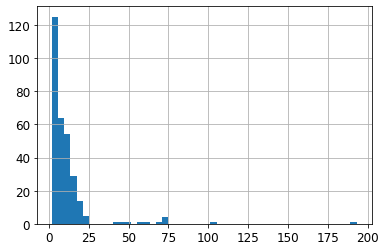

In [ ]:
scaled2.max(axis=1).hist(bins=50);

In [ ]:
scaled2_unstack = post_process(scaled2)

In [ ]:
scaled2_unstack.to_csv('q85_average_unstack.csv',index=False)

set max value to be 40, this will nonlinearly change the target values

In [ ]:
s = scaled2.clip(upper=40)

In [ ]:
s_unstack = post_process(s)

In [ ]:
s_unstack.to_csv('q85_average_upper40_unstack.csv',index=False)

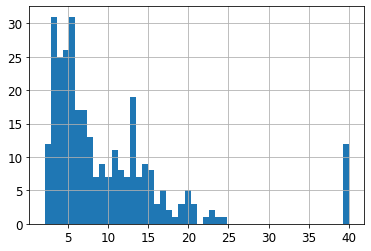

In [ ]:
s.max(axis=1).hist(bins=50);

## Others

Recheck the plot and see if they are in the similar value range

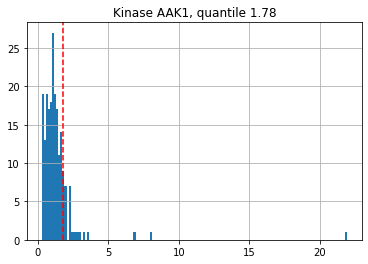

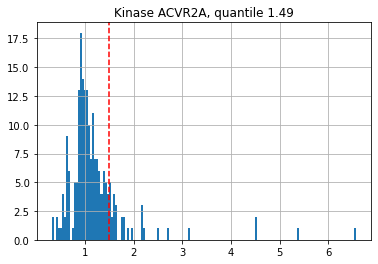

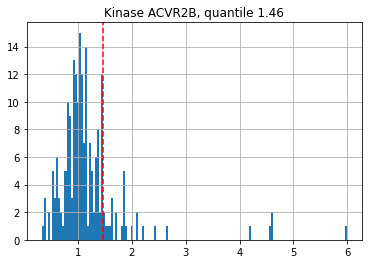

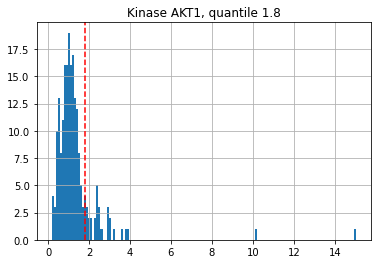

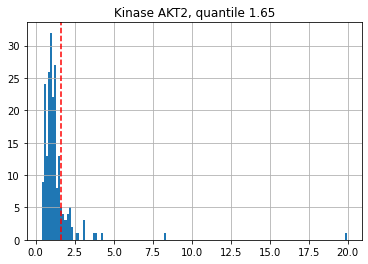

...

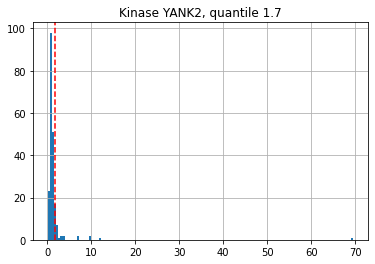

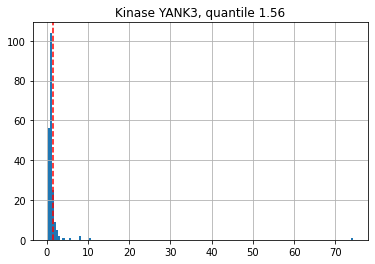

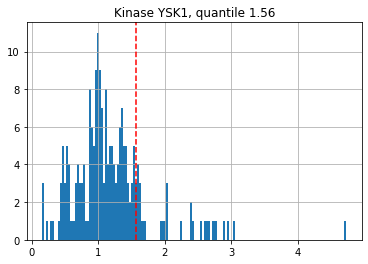

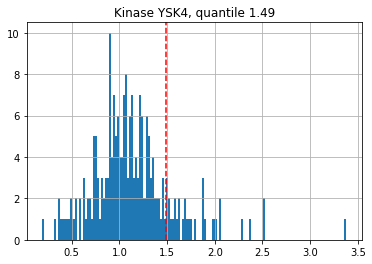

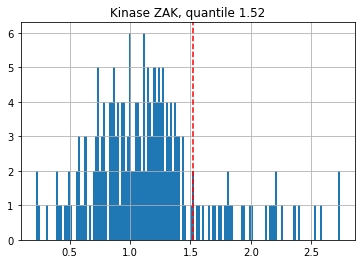

In [ ]:
for i,r in scaled.iterrows():
    q = r.quantile(0.85)
    r.hist(bins=150)
    plt.axvline(x=q, color='red', linestyle='--')
    plt.title(f'Kinase {i}, quantile {q.round(2)}')
    # plt.xlim([min(r), q + q +q +q +q])
    plt.show()

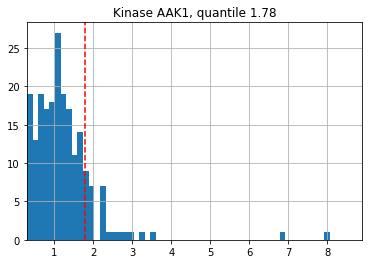

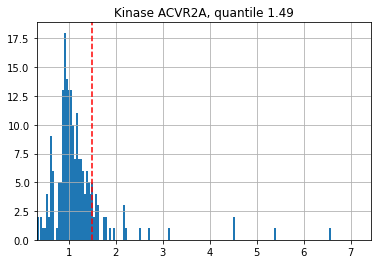

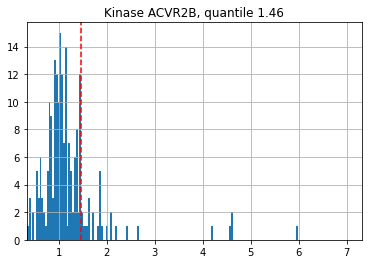

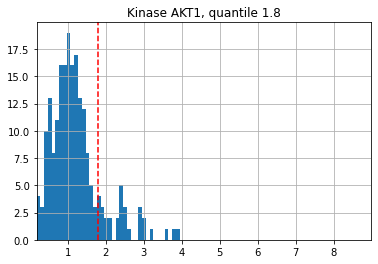

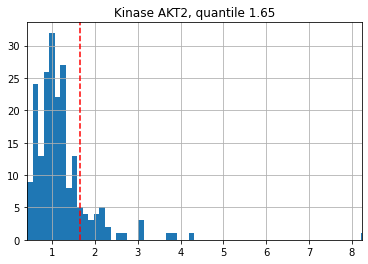

...

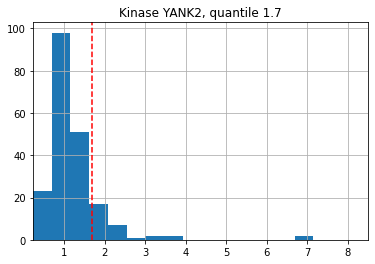

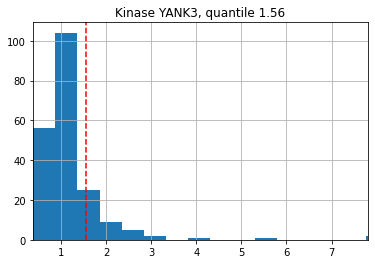

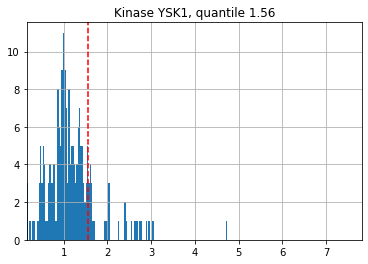

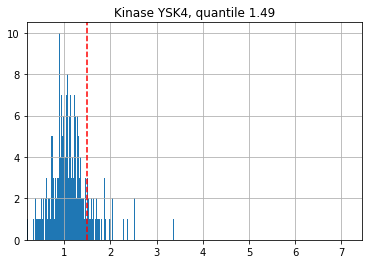

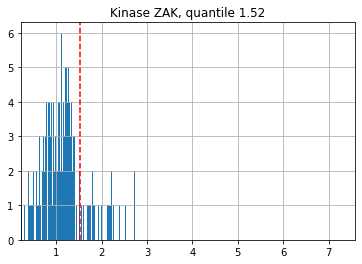

In [ ]:
for i,r in scaled.iterrows():
    q = r.quantile(0.85)
    r.hist(bins=150)
    plt.axvline(x=q, color='red', linestyle='--')
    plt.title(f'Kinase {i}, quantile {q.round(2)}')
    plt.xlim([min(r), q + q +q +q +q])
    plt.show()

## Plot

Draw assay plot from unstack

In [ ]:
def plot_assay(unstack, kinase):
    aa_order = [i for i in 'PGACSTVILMFYWHKRQNDEty']
    position_order = [str(i) for i in range(-5,5)]
    position_order.remove('0')
    
    k = unstack.query(f'kinase == "{kinase}"')
    kk = k.pivot(index='aa',columns='position',values='target')
    kkk = kk.reindex(index=aa_order, columns=position_order)
    
    plt.figure(figsize=(6, 10))
    sns.heatmap(kkk, cmap='binary', annot=False)
    plt.title(kinase)
    plt.show()

In [ ]:
raw_unstack = post_process(raw)

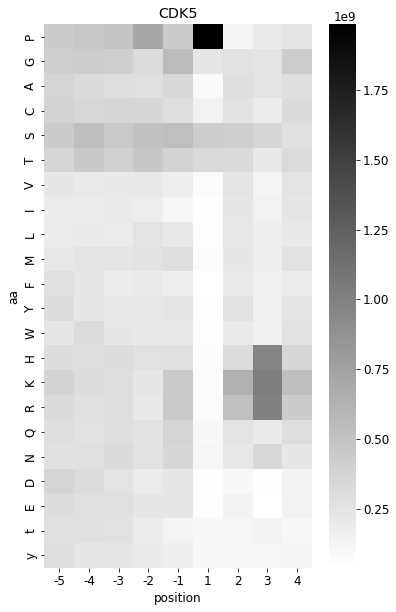

In [ ]:
plot_assay(raw_unstack,"CDK5")